Toy Measurement Control Initialized


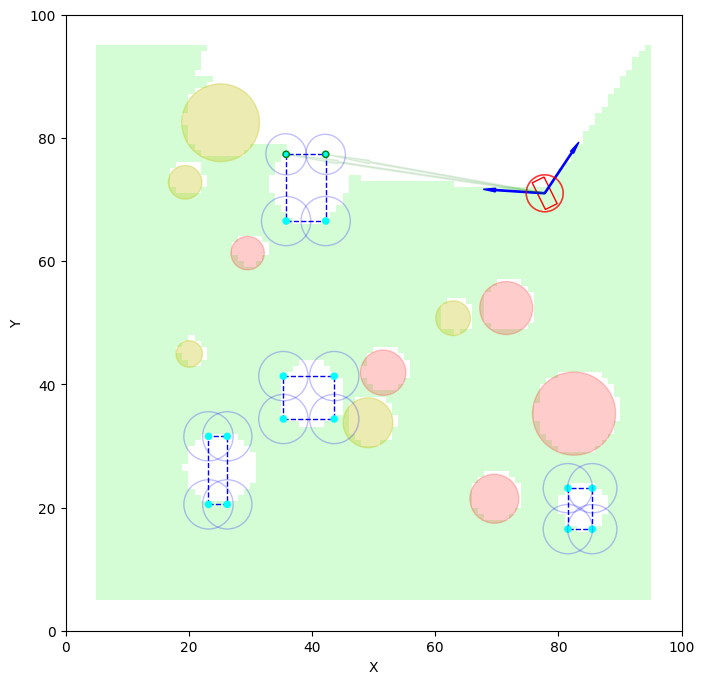

In [21]:
import numpy as np
import pandas as pd
import timeit
import sys
import cProfile
# Add measurement mcts python package to path
sys.path.append('../src/measurement_mcts')
from measurement_mcts.mcts.mcts import mcts_search, get_best_trajectory, MCTSNode, DummyNode
from measurement_mcts.mcts.tree_viz import render_pyvis
from measurement_mcts.state_evaluation.reinforcement_learning import MCTSRLWrapper, plot_state_image
from measurement_mcts.environment.measurement_control_env import MeasurementControlEnvironment

env = MeasurementControlEnvironment(init_reset=False)
env.load_state('../state_configurations', 'evaluation2')
env.draw_state(env.get_state())
starting_state = env.get_state()

# Parameters

In [11]:
learning_iterations = 25
explore_factor = 100
discount_factor = 1.0

## Control
Normal Method

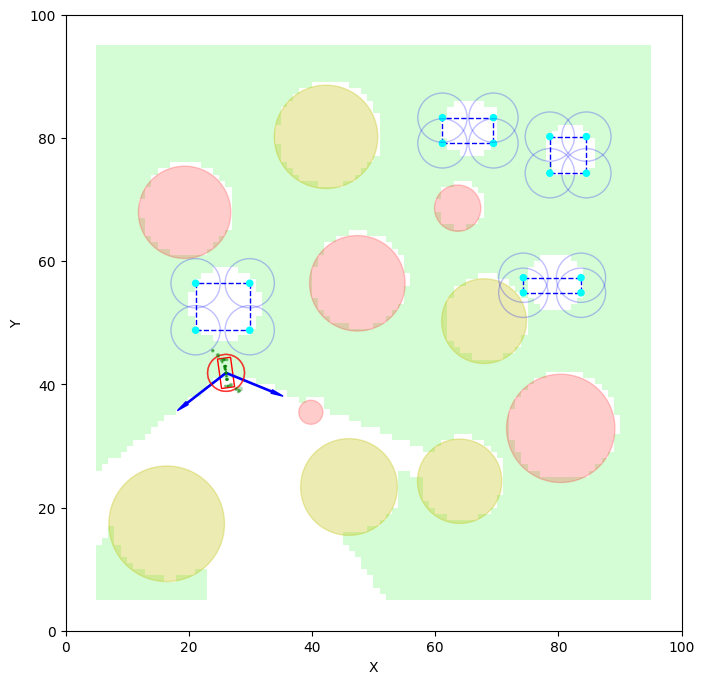

In [7]:
best_action, root = mcts_search(env, None, starting_state, learning_iterations=learning_iterations,
                                    explore_factor=0.4, discount_factor=1.0)

# Display the tree and state
render_pyvis(root, env.action_space, show_unsimulated=False)
env.draw_state(starting_state, plot_explore_grid=True, root_node=root, scaling=4, bias=0.1, max=1., rew=True)

## Method 1
This method of making each learning iteration go all the way to the horizon takes the same action over and over until reaching the horizon.

It expands each node along the way and then performs backprop from the final node

The problem with this is that the MCTS search wants to just take the same path that the last rollout took. This makes the search the search far too directed towards the best rollout. In exchange I have to bump the explore factor way up to compensate and not waste learning iterations on doing nothing. You can tell this is happening by leaf nodes in the tree having more than one visit.

In [18]:
def test_search(starting_state, learning_iterations, explore_factor, discount_factor):
    root = MCTSNode(env, starting_state, action=None, parent=DummyNode(), explore_factor=explore_factor, discount_factor=discount_factor)
    child_priors, value_estimate = np.ones([env.N]) / env.N, 0. # Even probability for each action for testing and no expected reward to go
    root.expand(child_priors) # Expand the leaf node with the child priors

    for _ in range(learning_iterations):
        leaf = root.select_leaf() # Select with UCB up to the leaf node and do one environment step
        child_priors, value_estimate = np.ones([env.N]) / env.N, 0. # Even probability for each action for testing and no expected reward to go
        leaf.expand(child_priors) # Expand the leaf node with the child priors
        
        # Simulate the same action until reaching a terminal state
        while not leaf.done:
            leaf = leaf.maybe_add_child(leaf.action)
            child_priors, value_estimate = np.ones([env.N]) / env.N, 0. # Even probability for each action for testing and no expected reward to go
            leaf.expand(child_priors) # Expand the leaf node with the child priors
            
        leaf.backup(value_estimate) # Backup the value estimate up the tree to the root node
        
    return root

## Method 2
Same thing here except now we don't maintain the rollout nodes at all we just discard them

In [17]:
def test_search(starting_state, learning_iterations, explore_factor, discount_factor):
    root = MCTSNode(env, starting_state, action=None, parent=DummyNode(), explore_factor=explore_factor, discount_factor=discount_factor)
    child_priors, value_estimate = np.ones([env.N]) / env.N, 0. # Even probability for each action for testing and no expected reward to go
    root.expand(child_priors) # Expand the leaf node with the child priors

    for _ in range(learning_iterations):
        leaf = root.select_leaf() # Select with UCB up to the leaf node and do one environment step
        child_priors = np.ones([env.N]) / env.N # Even probability for each action for testing and no expected reward to go
        leaf.expand(child_priors) # Expand the leaf node with the child priors
        
        # Simulate the same action until reaching a terminal state
        done = False
        state = leaf.state
        cumulative_reward = 0
        while not done:
            state, reward, done = env.step(state, env.action_space[leaf.action])
            cumulative_reward += reward
            
        leaf.backup(cumulative_reward) # Backup the value estimate up the tree to the root node
        
    return root

## Method 3
The difference here is to not expand each node along the rollout and instead just accumulate the rewards along the way and do backprop from the original node we started the rollout from.

My hope is that by doing this it will make selection act as it did before the rollouts were added but also ensure that we aren't wasting computation resimulating the same state-action pair over and over again.

In [16]:
def test_search(starting_state, learning_iterations, explore_factor, discount_factor):
    root = MCTSNode(env, starting_state, action=None, parent=DummyNode(), explore_factor=explore_factor, discount_factor=discount_factor)
    child_priors, value_estimate = np.ones([env.N]) / env.N, 0. # Even probability for each action for testing and no expected reward to go
    root.expand(child_priors) # Expand the leaf node with the child priors

    for _ in range(learning_iterations):
        leaf = root.select_leaf() # Select with UCB up to the leaf node and do one environment step
        child_priors = np.ones([env.N]) / env.N # Even probability for each action for testing
        leaf.expand(child_priors) # Expand the leaf node with the child priors
        
        # Simulate the same action until reaching a terminal state to get value estimate
        cumulative_reward = 0.
        rollout_leaf = leaf
        while not rollout_leaf.done:
            rollout_leaf = rollout_leaf.maybe_add_child(leaf.action)
            cumulative_reward += rollout_leaf.reward * rollout_leaf.discount_factor ** rollout_leaf.state[3]
            
            
        leaf.backup(cumulative_reward) # Backup the rollout cumulative reward up the tree to the root node

    return root

# Single Search Plot

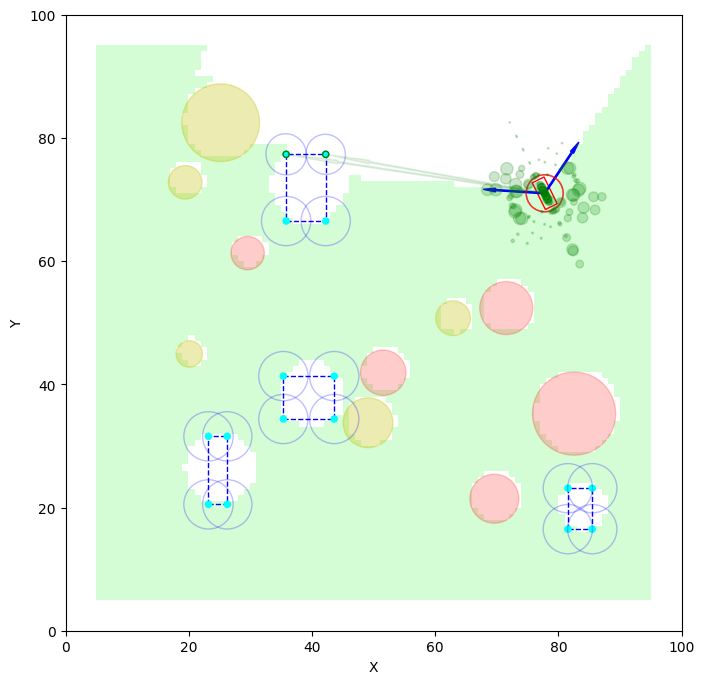

In [19]:
root = test_search(starting_state, learning_iterations, explore_factor, discount_factor)

# Display the tree and state
render_pyvis(root, env.action_space, show_unsimulated=False)
env.draw_state(starting_state, plot_explore_grid=True, root_node=root, scaling=4, bias=0.1, max=1., rew=True)

# Single Search Animation

In [4]:
root = test_search(starting_state, learning_iterations, explore_factor, discount_factor)

actions, states, rewards = get_best_trajectory(root, highest_Q=True, return_rewards=True)
print(f'Best trajectory: {actions}')
title = f'LI={learning_iterations}, EF={explore_factor}, DF={discount_factor}, HL={env.horizon_length}'
env.draw_state_set(states, title_perm=title, rewards=rewards)

Best trajectory: [array([1., 1.]), array([1., 1.]), array([1., 1.]), array([1., 1.]), array([1., 1.]), array([1., 1.]), array([0., 0.])]


# Multiple Search Animation

In [14]:
num_actions = 150
state = starting_state
states = [starting_state]
rewards = []
roots = []
start_time = timeit.default_timer()
for i in range(num_actions):
    print(f'Action {i + 1}/{num_actions}')
    root = test_search(state, learning_iterations, explore_factor, discount_factor)
    best_action = env.action_space[root.children[root.best_child()].action]
    print(f'Best action: {best_action}')
    state, reward, done = env.step(state, best_action)
    state = (state[0], state[1], state[2], 0) # Reset horizon step back to 0 for next search
    states.append(state)
    rewards.append(reward)
    roots.append(root)
comp_time = round(timeit.default_timer() - start_time, 2)
title = f'{num_actions} MCTS searches in {comp_time} seconds\n\
LI={learning_iterations}, EF={explore_factor}, DF={discount_factor}, HL={env.horizon_length}'
print(f'Done in {comp_time} seconds')

print('Creating state set visualization...')
env.draw_state_set(states, title_perm=title, rewards=rewards)

Action 1/150
Best action: [0.5 1. ]
Action 2/150
Best action: [1. 0.]
Action 3/150
Best action: [1. 0.]
Action 4/150
Best action: [0. 0.]
Action 5/150
Best action: [0. 0.]
Action 6/150
Best action: [0. 0.]
Action 7/150
Best action: [0. 0.]
Action 8/150
Best action: [-0.5 -1. ]
Action 9/150
Best action: [0.   0.25]
Action 10/150
Best action: [-0.5  0. ]
Action 11/150
Best action: [ 0. -1.]
Action 12/150
Best action: [0.5 0. ]
Action 13/150
Best action: [0. 1.]
Action 14/150
Best action: [0. 1.]
Action 15/150
Best action: [-0.5  0. ]
Action 16/150
Best action: [-1.   -0.25]
Action 17/150
Best action: [ 0.5  -0.25]
Action 18/150


/home/austin/MeasurementMCTS/test/../src/measurement_mcts/measurement_mcts/environment/object_manager.py:417: RuntimeWarning: invalid value encountered in arcsin
  mean_to_edge_angle = np.arcsin(tuple.radius / (tuple.range + tuple.radius)) # Adding back radius which was removed before for sorting


Best action: [ 1.   -0.25]
Action 19/150


/home/austin/MeasurementMCTS/test/../src/measurement_mcts/measurement_mcts/environment/object_manager.py:417: RuntimeWarning: invalid value encountered in arcsin
  mean_to_edge_angle = np.arcsin(tuple.radius / (tuple.range + tuple.radius)) # Adding back radius which was removed before for sorting
/home/austin/MeasurementMCTS/test/../src/measurement_mcts/measurement_mcts/environment/object_manager.py:417: RuntimeWarning: invalid value encountered in arcsin
  mean_to_edge_angle = np.arcsin(tuple.radius / (tuple.range + tuple.radius)) # Adding back radius which was removed before for sorting
/home/austin/MeasurementMCTS/test/../src/measurement_mcts/measurement_mcts/environment/object_manager.py:417: RuntimeWarning: invalid value encountered in arcsin
  mean_to_edge_angle = np.arcsin(tuple.radius / (tuple.range + tuple.radius)) # Adding back radius which was removed before for sorting
/home/austin/MeasurementMCTS/test/../src/measurement_mcts/measurement_mcts/environment/object_manager.py:4

Best action: [0. 0.]
Action 20/150
Best action: [0. 0.]
Action 21/150


/home/austin/MeasurementMCTS/test/../src/measurement_mcts/measurement_mcts/environment/object_manager.py:417: RuntimeWarning: invalid value encountered in arcsin
  mean_to_edge_angle = np.arcsin(tuple.radius / (tuple.range + tuple.radius)) # Adding back radius which was removed before for sorting
/home/austin/MeasurementMCTS/test/../src/measurement_mcts/measurement_mcts/environment/object_manager.py:417: RuntimeWarning: invalid value encountered in arcsin
  mean_to_edge_angle = np.arcsin(tuple.radius / (tuple.range + tuple.radius)) # Adding back radius which was removed before for sorting
/home/austin/MeasurementMCTS/test/../src/measurement_mcts/measurement_mcts/environment/object_manager.py:417: RuntimeWarning: invalid value encountered in arcsin
  mean_to_edge_angle = np.arcsin(tuple.radius / (tuple.range + tuple.radius)) # Adding back radius which was removed before for sorting
/home/austin/MeasurementMCTS/test/../src/measurement_mcts/measurement_mcts/environment/object_manager.py:4

Best action: [ 0.5  -0.25]
Action 22/150


/home/austin/MeasurementMCTS/test/../src/measurement_mcts/measurement_mcts/environment/object_manager.py:417: RuntimeWarning: invalid value encountered in arcsin
  mean_to_edge_angle = np.arcsin(tuple.radius / (tuple.range + tuple.radius)) # Adding back radius which was removed before for sorting
/home/austin/MeasurementMCTS/test/../src/measurement_mcts/measurement_mcts/environment/object_manager.py:417: RuntimeWarning: invalid value encountered in arcsin
  mean_to_edge_angle = np.arcsin(tuple.radius / (tuple.range + tuple.radius)) # Adding back radius which was removed before for sorting
/home/austin/MeasurementMCTS/test/../src/measurement_mcts/measurement_mcts/environment/object_manager.py:417: RuntimeWarning: invalid value encountered in arcsin
  mean_to_edge_angle = np.arcsin(tuple.radius / (tuple.range + tuple.radius)) # Adding back radius which was removed before for sorting
/home/austin/MeasurementMCTS/test/../src/measurement_mcts/measurement_mcts/environment/object_manager.py:4

Best action: [0.   0.25]
Action 23/150


/home/austin/MeasurementMCTS/test/../src/measurement_mcts/measurement_mcts/environment/object_manager.py:417: RuntimeWarning: invalid value encountered in arcsin
  mean_to_edge_angle = np.arcsin(tuple.radius / (tuple.range + tuple.radius)) # Adding back radius which was removed before for sorting


Best action: [0.   0.25]
Action 24/150


/home/austin/MeasurementMCTS/test/../src/measurement_mcts/measurement_mcts/environment/object_manager.py:417: RuntimeWarning: invalid value encountered in arcsin
  mean_to_edge_angle = np.arcsin(tuple.radius / (tuple.range + tuple.radius)) # Adding back radius which was removed before for sorting
/home/austin/MeasurementMCTS/test/../src/measurement_mcts/measurement_mcts/environment/object_manager.py:417: RuntimeWarning: invalid value encountered in arcsin
  mean_to_edge_angle = np.arcsin(tuple.radius / (tuple.range + tuple.radius)) # Adding back radius which was removed before for sorting


Best action: [0. 0.]
Action 25/150


/home/austin/MeasurementMCTS/test/../src/measurement_mcts/measurement_mcts/environment/object_manager.py:417: RuntimeWarning: invalid value encountered in arcsin
  mean_to_edge_angle = np.arcsin(tuple.radius / (tuple.range + tuple.radius)) # Adding back radius which was removed before for sorting
/home/austin/MeasurementMCTS/test/../src/measurement_mcts/measurement_mcts/environment/object_manager.py:417: RuntimeWarning: invalid value encountered in arcsin
  mean_to_edge_angle = np.arcsin(tuple.radius / (tuple.range + tuple.radius)) # Adding back radius which was removed before for sorting


Best action: [0. 0.]
Action 26/150
Best action: [0. 0.]
Action 27/150
Best action: [0. 0.]
Action 28/150
Best action: [0. 0.]
Action 29/150
Best action: [0.   0.25]
Action 30/150
Best action: [0.   0.25]
Action 31/150
Best action: [-0.5  -0.25]
Action 32/150
Best action: [ 1. -1.]
Action 33/150
Best action: [-1.  0.]
Action 34/150
Best action: [-0.5  0. ]
Action 35/150
Best action: [0.   0.25]
Action 36/150
Best action: [-0.5  1. ]
Action 37/150
Best action: [ 0. -1.]
Action 38/150
Best action: [ 0. -1.]
Action 39/150
Best action: [ 0.   -0.25]
Action 40/150
Best action: [-1.  0.]
Action 41/150
Best action: [0.   0.25]
Action 42/150
Best action: [0.   0.25]
Action 43/150
Best action: [ 1. -1.]
Action 44/150
Best action: [ 0.5  -0.25]
Action 45/150
Best action: [-0.5   0.25]
Action 46/150
Best action: [-1.    0.25]
Action 47/150
Best action: [0.   0.25]
Action 48/150
Best action: [-1.  0.]
Action 49/150
Best action: [0. 0.]
Action 50/150
Best action: [-1.   -0.25]
Action 51/150
Best act

/home/austin/MeasurementMCTS/test/../src/measurement_mcts/measurement_mcts/environment/object_manager.py:417: RuntimeWarning: invalid value encountered in arcsin
  mean_to_edge_angle = np.arcsin(tuple.radius / (tuple.range + tuple.radius)) # Adding back radius which was removed before for sorting


Best action: [ 0.   -0.25]
Action 56/150


/home/austin/MeasurementMCTS/test/../src/measurement_mcts/measurement_mcts/environment/object_manager.py:417: RuntimeWarning: invalid value encountered in arcsin
  mean_to_edge_angle = np.arcsin(tuple.radius / (tuple.range + tuple.radius)) # Adding back radius which was removed before for sorting
/home/austin/MeasurementMCTS/test/../src/measurement_mcts/measurement_mcts/environment/object_manager.py:417: RuntimeWarning: invalid value encountered in arcsin
  mean_to_edge_angle = np.arcsin(tuple.radius / (tuple.range + tuple.radius)) # Adding back radius which was removed before for sorting
/home/austin/MeasurementMCTS/test/../src/measurement_mcts/measurement_mcts/environment/object_manager.py:417: RuntimeWarning: invalid value encountered in arcsin
  mean_to_edge_angle = np.arcsin(tuple.radius / (tuple.range + tuple.radius)) # Adding back radius which was removed before for sorting
/home/austin/MeasurementMCTS/test/../src/measurement_mcts/measurement_mcts/environment/object_manager.py:4

Best action: [0. 0.]
Action 57/150


/home/austin/MeasurementMCTS/test/../src/measurement_mcts/measurement_mcts/environment/object_manager.py:417: RuntimeWarning: invalid value encountered in arcsin
  mean_to_edge_angle = np.arcsin(tuple.radius / (tuple.range + tuple.radius)) # Adding back radius which was removed before for sorting
/home/austin/MeasurementMCTS/test/../src/measurement_mcts/measurement_mcts/environment/object_manager.py:417: RuntimeWarning: invalid value encountered in arcsin
  mean_to_edge_angle = np.arcsin(tuple.radius / (tuple.range + tuple.radius)) # Adding back radius which was removed before for sorting
/home/austin/MeasurementMCTS/test/../src/measurement_mcts/measurement_mcts/environment/object_manager.py:417: RuntimeWarning: invalid value encountered in arcsin
  mean_to_edge_angle = np.arcsin(tuple.radius / (tuple.range + tuple.radius)) # Adding back radius which was removed before for sorting
/home/austin/MeasurementMCTS/test/../src/measurement_mcts/measurement_mcts/environment/object_manager.py:4

Best action: [1.   0.25]
Action 58/150


/home/austin/MeasurementMCTS/test/../src/measurement_mcts/measurement_mcts/environment/object_manager.py:417: RuntimeWarning: invalid value encountered in arcsin
  mean_to_edge_angle = np.arcsin(tuple.radius / (tuple.range + tuple.radius)) # Adding back radius which was removed before for sorting
/home/austin/MeasurementMCTS/test/../src/measurement_mcts/measurement_mcts/environment/object_manager.py:417: RuntimeWarning: invalid value encountered in arcsin
  mean_to_edge_angle = np.arcsin(tuple.radius / (tuple.range + tuple.radius)) # Adding back radius which was removed before for sorting
/home/austin/MeasurementMCTS/test/../src/measurement_mcts/measurement_mcts/environment/object_manager.py:417: RuntimeWarning: invalid value encountered in arcsin
  mean_to_edge_angle = np.arcsin(tuple.radius / (tuple.range + tuple.radius)) # Adding back radius which was removed before for sorting


Best action: [0.   0.25]
Action 59/150


/home/austin/MeasurementMCTS/test/../src/measurement_mcts/measurement_mcts/environment/object_manager.py:417: RuntimeWarning: invalid value encountered in arcsin
  mean_to_edge_angle = np.arcsin(tuple.radius / (tuple.range + tuple.radius)) # Adding back radius which was removed before for sorting


Best action: [-0.5   0.25]
Action 60/150
Best action: [0. 0.]
Action 61/150
Best action: [0.5 0. ]
Action 62/150
Best action: [0.5 0. ]
Action 63/150
Best action: [-0.5  0. ]
Action 64/150
Best action: [0.   0.25]
Action 65/150
Best action: [0.5 0. ]
Action 66/150
Best action: [1. 0.]
Action 67/150
Best action: [0.5 0. ]
Action 68/150
Best action: [0. 0.]
Action 69/150
Best action: [0.   0.25]
Action 70/150
Best action: [0. 0.]
Action 71/150
Best action: [-0.5  -0.25]
Action 72/150
Best action: [0.5  0.25]
Action 73/150
Best action: [ 0.5  -0.25]
Action 74/150
Best action: [ 0.5  -0.25]
Action 75/150


/home/austin/MeasurementMCTS/test/../src/measurement_mcts/measurement_mcts/environment/object_manager.py:417: RuntimeWarning: invalid value encountered in arcsin
  mean_to_edge_angle = np.arcsin(tuple.radius / (tuple.range + tuple.radius)) # Adding back radius which was removed before for sorting
/home/austin/MeasurementMCTS/test/../src/measurement_mcts/measurement_mcts/environment/object_manager.py:417: RuntimeWarning: invalid value encountered in arcsin
  mean_to_edge_angle = np.arcsin(tuple.radius / (tuple.range + tuple.radius)) # Adding back radius which was removed before for sorting
/home/austin/MeasurementMCTS/test/../src/measurement_mcts/measurement_mcts/environment/object_manager.py:417: RuntimeWarning: invalid value encountered in arcsin
  mean_to_edge_angle = np.arcsin(tuple.radius / (tuple.range + tuple.radius)) # Adding back radius which was removed before for sorting


Best action: [-0.5  1. ]
Action 76/150
Best action: [ 0.   -0.25]
Action 77/150


/home/austin/MeasurementMCTS/test/../src/measurement_mcts/measurement_mcts/environment/object_manager.py:417: RuntimeWarning: invalid value encountered in arcsin
  mean_to_edge_angle = np.arcsin(tuple.radius / (tuple.range + tuple.radius)) # Adding back radius which was removed before for sorting


Best action: [-0.5  -0.25]
Action 78/150
Best action: [-0.5  -0.25]
Action 79/150
Best action: [-0.5  -0.25]
Action 80/150
Best action: [-1.    0.25]
Action 81/150
Best action: [0.   0.25]
Action 82/150
Best action: [0.   0.25]
Action 83/150
Best action: [0.   0.25]
Action 84/150
Best action: [0.   0.25]
Action 85/150
Best action: [0.   0.25]
Action 86/150
Best action: [0.   0.25]
Action 87/150
Best action: [0.   0.25]
Action 88/150
Best action: [-1.   -0.25]
Action 89/150
Best action: [ 0.5 -1. ]
Action 90/150
Best action: [1.   0.25]
Action 91/150
Best action: [0. 0.]
Action 92/150
Best action: [0.   0.25]
Action 93/150
Best action: [0.   0.25]
Action 94/150
Best action: [0.   0.25]
Action 95/150
Best action: [-0.5  0. ]
Action 96/150
Best action: [0.   0.25]
Action 97/150
Best action: [-0.5  0. ]
Action 98/150
Best action: [0.5 0. ]
Action 99/150
Best action: [-1.   -0.25]
Action 100/150
Best action: [0. 0.]
Action 101/150
Best action: [0. 0.]
Action 102/150
Best action: [0. 0.]
Act

/home/austin/MeasurementMCTS/test/../src/measurement_mcts/measurement_mcts/environment/object_manager.py:417: RuntimeWarning: invalid value encountered in arcsin
  mean_to_edge_angle = np.arcsin(tuple.radius / (tuple.range + tuple.radius)) # Adding back radius which was removed before for sorting
/home/austin/MeasurementMCTS/test/../src/measurement_mcts/measurement_mcts/environment/object_manager.py:417: RuntimeWarning: invalid value encountered in arcsin
  mean_to_edge_angle = np.arcsin(tuple.radius / (tuple.range + tuple.radius)) # Adding back radius which was removed before for sorting


Best action: [ 0.5 -1. ]
Action 133/150


/home/austin/MeasurementMCTS/test/../src/measurement_mcts/measurement_mcts/environment/object_manager.py:417: RuntimeWarning: invalid value encountered in arcsin
  mean_to_edge_angle = np.arcsin(tuple.radius / (tuple.range + tuple.radius)) # Adding back radius which was removed before for sorting
/home/austin/MeasurementMCTS/test/../src/measurement_mcts/measurement_mcts/environment/object_manager.py:417: RuntimeWarning: invalid value encountered in arcsin
  mean_to_edge_angle = np.arcsin(tuple.radius / (tuple.range + tuple.radius)) # Adding back radius which was removed before for sorting
/home/austin/MeasurementMCTS/test/../src/measurement_mcts/measurement_mcts/environment/object_manager.py:417: RuntimeWarning: invalid value encountered in arcsin
  mean_to_edge_angle = np.arcsin(tuple.radius / (tuple.range + tuple.radius)) # Adding back radius which was removed before for sorting
/home/austin/MeasurementMCTS/test/../src/measurement_mcts/measurement_mcts/environment/object_manager.py:4

Best action: [ 0.5 -1. ]
Action 134/150
Best action: [-0.5  -0.25]
Action 135/150
Best action: [-0.5  -0.25]
Action 136/150
Best action: [-0.5  -0.25]
Action 137/150


/home/austin/MeasurementMCTS/test/../src/measurement_mcts/measurement_mcts/environment/object_manager.py:417: RuntimeWarning: invalid value encountered in arcsin
  mean_to_edge_angle = np.arcsin(tuple.radius / (tuple.range + tuple.radius)) # Adding back radius which was removed before for sorting


Best action: [0.5 0. ]
Action 138/150
Best action: [ 0. -1.]
Action 139/150
Best action: [1.   0.25]
Action 140/150
Best action: [0. 0.]
Action 141/150


/home/austin/MeasurementMCTS/test/../src/measurement_mcts/measurement_mcts/environment/object_manager.py:417: RuntimeWarning: invalid value encountered in arcsin
  mean_to_edge_angle = np.arcsin(tuple.radius / (tuple.range + tuple.radius)) # Adding back radius which was removed before for sorting
/home/austin/MeasurementMCTS/test/../src/measurement_mcts/measurement_mcts/environment/object_manager.py:417: RuntimeWarning: invalid value encountered in arcsin
  mean_to_edge_angle = np.arcsin(tuple.radius / (tuple.range + tuple.radius)) # Adding back radius which was removed before for sorting
/home/austin/MeasurementMCTS/test/../src/measurement_mcts/measurement_mcts/environment/object_manager.py:417: RuntimeWarning: invalid value encountered in arcsin
  mean_to_edge_angle = np.arcsin(tuple.radius / (tuple.range + tuple.radius)) # Adding back radius which was removed before for sorting
/home/austin/MeasurementMCTS/test/../src/measurement_mcts/measurement_mcts/environment/object_manager.py:4

Best action: [1.   0.25]
Action 142/150


/home/austin/MeasurementMCTS/test/../src/measurement_mcts/measurement_mcts/environment/object_manager.py:417: RuntimeWarning: invalid value encountered in arcsin
  mean_to_edge_angle = np.arcsin(tuple.radius / (tuple.range + tuple.radius)) # Adding back radius which was removed before for sorting
/home/austin/MeasurementMCTS/test/../src/measurement_mcts/measurement_mcts/environment/object_manager.py:417: RuntimeWarning: invalid value encountered in arcsin
  mean_to_edge_angle = np.arcsin(tuple.radius / (tuple.range + tuple.radius)) # Adding back radius which was removed before for sorting
/home/austin/MeasurementMCTS/test/../src/measurement_mcts/measurement_mcts/environment/object_manager.py:417: RuntimeWarning: invalid value encountered in arcsin
  mean_to_edge_angle = np.arcsin(tuple.radius / (tuple.range + tuple.radius)) # Adding back radius which was removed before for sorting
/home/austin/MeasurementMCTS/test/../src/measurement_mcts/measurement_mcts/environment/object_manager.py:4

Best action: [0. 0.]
Action 143/150


/home/austin/MeasurementMCTS/test/../src/measurement_mcts/measurement_mcts/environment/object_manager.py:417: RuntimeWarning: invalid value encountered in arcsin
  mean_to_edge_angle = np.arcsin(tuple.radius / (tuple.range + tuple.radius)) # Adding back radius which was removed before for sorting
/home/austin/MeasurementMCTS/test/../src/measurement_mcts/measurement_mcts/environment/object_manager.py:417: RuntimeWarning: invalid value encountered in arcsin
  mean_to_edge_angle = np.arcsin(tuple.radius / (tuple.range + tuple.radius)) # Adding back radius which was removed before for sorting
/home/austin/MeasurementMCTS/test/../src/measurement_mcts/measurement_mcts/environment/object_manager.py:417: RuntimeWarning: invalid value encountered in arcsin
  mean_to_edge_angle = np.arcsin(tuple.radius / (tuple.range + tuple.radius)) # Adding back radius which was removed before for sorting
/home/austin/MeasurementMCTS/test/../src/measurement_mcts/measurement_mcts/environment/object_manager.py:4

Best action: [0. 0.]
Action 144/150


/home/austin/MeasurementMCTS/test/../src/measurement_mcts/measurement_mcts/environment/object_manager.py:417: RuntimeWarning: invalid value encountered in arcsin
  mean_to_edge_angle = np.arcsin(tuple.radius / (tuple.range + tuple.radius)) # Adding back radius which was removed before for sorting
/home/austin/MeasurementMCTS/test/../src/measurement_mcts/measurement_mcts/environment/object_manager.py:417: RuntimeWarning: invalid value encountered in arcsin
  mean_to_edge_angle = np.arcsin(tuple.radius / (tuple.range + tuple.radius)) # Adding back radius which was removed before for sorting


Best action: [0. 0.]
Action 145/150
Best action: [0. 0.]
Action 146/150
Best action: [0. 0.]
Action 147/150
Best action: [0. 0.]
Action 148/150
Best action: [-0.5  0. ]
Action 149/150
Best action: [-0.5  -0.25]
Action 150/150
Best action: [0. 0.]
Done in 471.53 seconds
Creating state set visualization...


# Profile a single search

In [28]:
filename = "../profiling/single_step.prof"
profiler = cProfile.Profile()
profiler.enable()
# root = test_search(starting_state, learning_iterations, explore_factor, discount_factor)
state, reward, done = env.step(starting_state, env.action_space[root.children[root.best_child()].action])
profiler.disable()
profiler.dump_stats(filename)

In [29]:
!snakeviz -s $filename

snakeviz web server started on 127.0.0.1:8080; enter Ctrl-C to exit
http://127.0.0.1:8080/snakeviz/%2Fhome%2Faustin%2FMeasurementMCTS%2Fprofiling%2Fsingle_step.prof
^C

Bye!


In [32]:
start_time = timeit.default_timer()
state, reward, done = env.step(starting_state, env.action_space[root.children[root.best_child()].action])
comp_time = round(timeit.default_timer() - start_time, 4)
print(f'Done in {comp_time} seconds')

Done in 0.0178 seconds
